In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!


def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [3]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN, 
        corresponding to a transposed convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''

        #     Steps:
        #       1) Do a transposed convolution using the given parameters.
        #       2) Do a batchnorm, except for the last layer.
        #       3) Follow each batchnorm with a ReLU activation.
        #       4) If its the final layer, use a Tanh activation after the deconvolution.

        # Build the neural block
        if not final_layer:
            return nn.Sequential(nn.ConvTranspose2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
                                 nn.BatchNorm2d(output_channels),
                                 nn.ReLU(inplace=True))
        else: # Final Layer
            return nn.Sequential(nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                                 nn.Tanh())

    def unsqueeze_noise(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns a copy of that noise with width and height = 1 and channels = z_dim.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return noise.view(len(noise), self.z_dim, 1, 1)

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = self.unsqueeze_noise(noise)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

In [8]:
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
    hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=16):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a discriminator block of DCGAN, 
        corresponding to a convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        #     Steps:
        #       1) Add a convolutional layer using the given parameters.
        #       2) Do a batchnorm, except for the last layer.
        #       3) Follow each batchnorm with a LeakyReLU activation with slope 0.2.
        #       Note: Don't use an activation on the final layer
        
        # Build the neural block
        if not final_layer:
            return nn.Sequential(nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                                 nn.BatchNorm2d(output_channels),
                                 nn.LeakyReLU(0.2, inplace=True))
        else: # Final Layer
            return nn.Sequential(nn.Conv2d(input_channels, output_channels, kernel_size, stride), nn.Sigmoid())

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [9]:
criterion = nn.BCEWithLogitsLoss()
z_dim = 64
display_step = 500
batch_size = 128
# A learning rate of 0.0002 works well on DCGAN
lr = 0.0002

# These parameters control the optimizer's momentum
beta_1 = 0.5 
beta_2 = 0.999
device = 'cuda'

# You can tranform the image values to be between -1 and 1 (the range of the tanh activation)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(MNIST('.', download=False, transform=transform), batch_size=batch_size, shuffle=True)

In [10]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta_1, beta_2))

# You initialize the weights to the normal distribution
# with mean 0 and standard deviation 0.02
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  6%|████▊                                                                            | 28/469 [00:00<00:10, 41.14it/s]

Epoch 1, step 500: Generator loss: 0.5646266488432886, discriminator loss: 0.6484334791898724


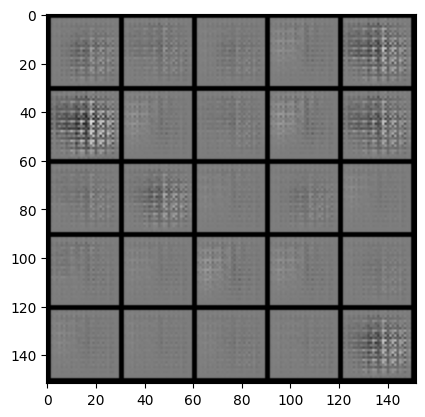

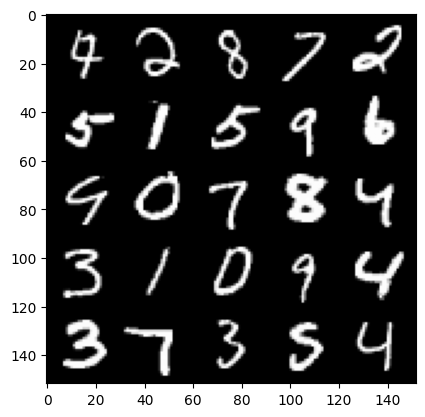

 12%|██████████                                                                       | 58/469 [00:01<00:09, 41.64it/s]

Epoch 2, step 1000: Generator loss: 0.672288854718208, discriminator loss: 0.5278732124567036


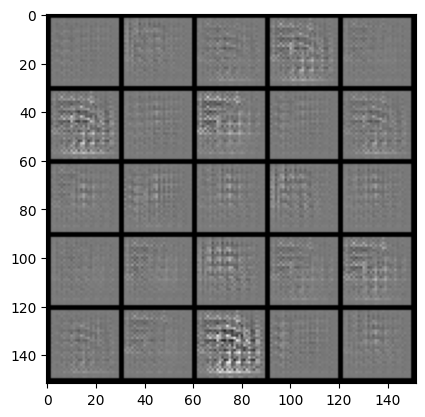

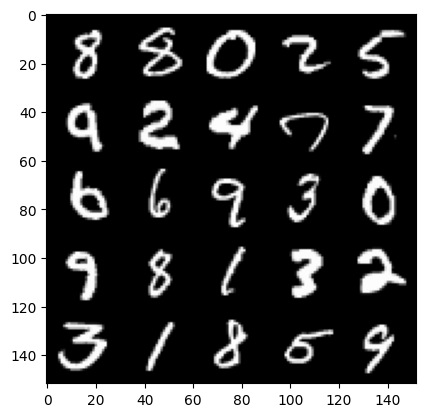

 20%|███████████████▉                                                                 | 92/469 [00:02<00:09, 39.27it/s]

Epoch 3, step 1500: Generator loss: 0.6868385884761806, discriminator loss: 0.509641230940819


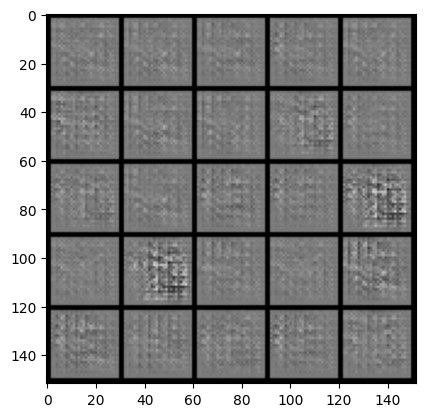

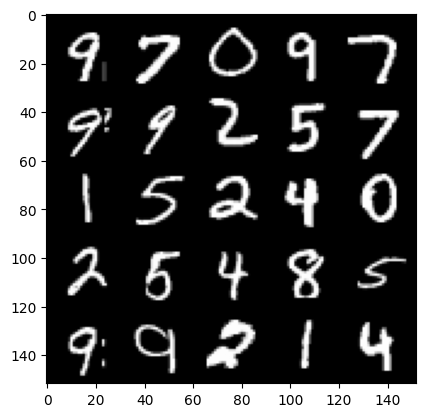

 26%|████████████████████▍                                                           | 120/469 [00:02<00:08, 40.89it/s]

Epoch 4, step 2000: Generator loss: 0.6646800639629364, discriminator loss: 0.5584694417715074


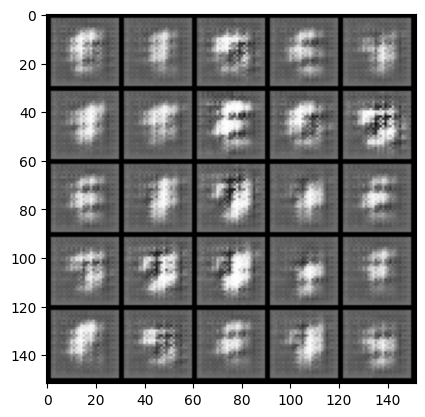

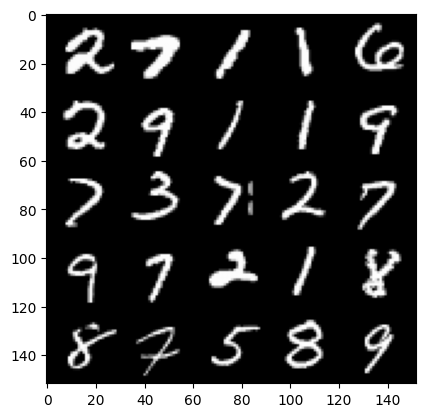

 32%|█████████████████████████▉                                                      | 152/469 [00:03<00:08, 38.14it/s]

Epoch 5, step 2500: Generator loss: 0.6654709209203721, discriminator loss: 0.6621243184804917


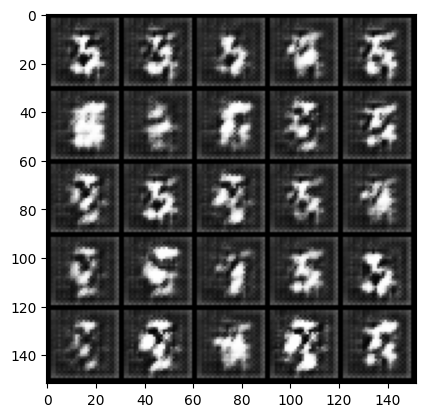

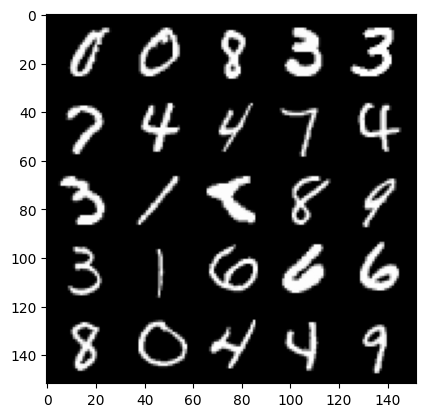

 40%|███████████████████████████████▋                                                | 186/469 [00:04<00:06, 40.89it/s]

Epoch 6, step 3000: Generator loss: 0.6795571945905688, discriminator loss: 0.6858011823892598


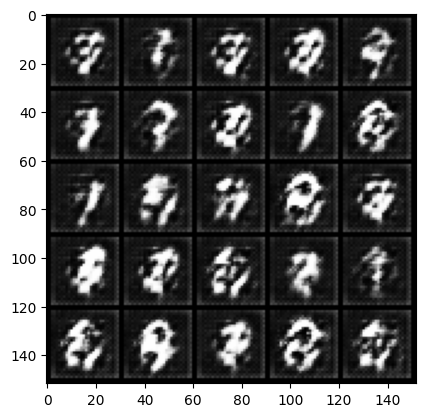

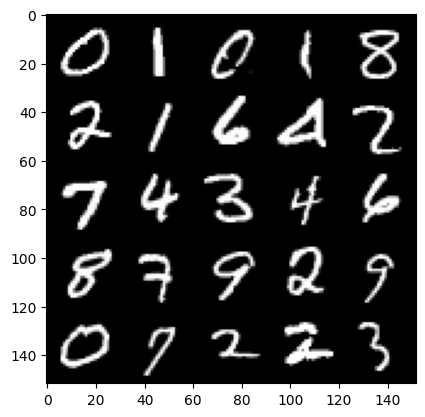

 46%|████████████████████████████████████▋                                           | 215/469 [00:05<00:06, 40.12it/s]

Epoch 7, step 3500: Generator loss: 0.6549517856836315, discriminator loss: 0.6809590339660648


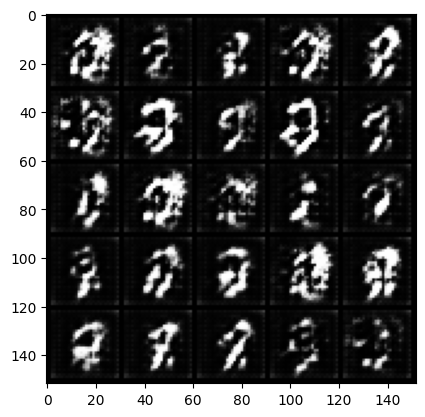

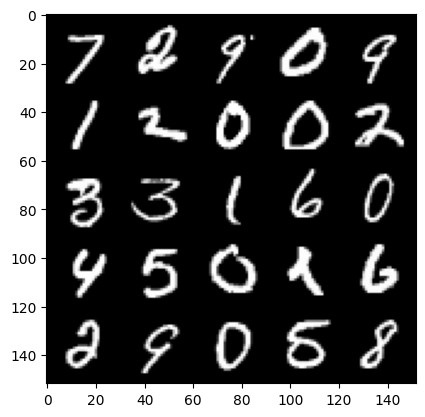

 52%|█████████████████████████████████████████▊                                      | 245/469 [00:06<00:05, 41.76it/s]

Epoch 8, step 4000: Generator loss: 0.6578231231570235, discriminator loss: 0.6859660898447042


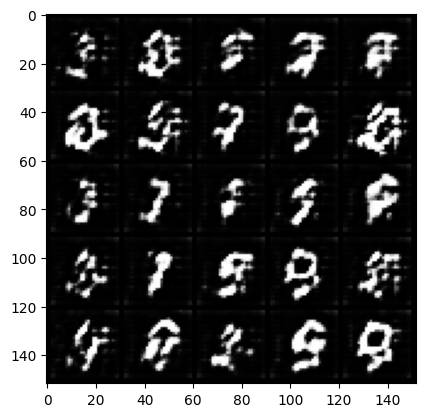

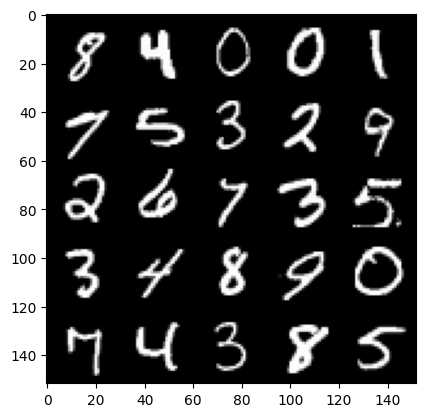

 59%|███████████████████████████████████████████████▏                                | 277/469 [00:06<00:04, 40.39it/s]

Epoch 9, step 4500: Generator loss: 0.6229124375581737, discriminator loss: 0.67725836956501


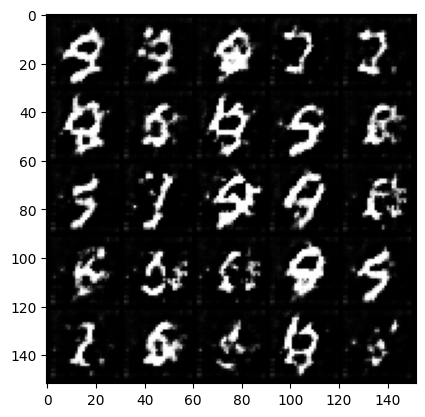

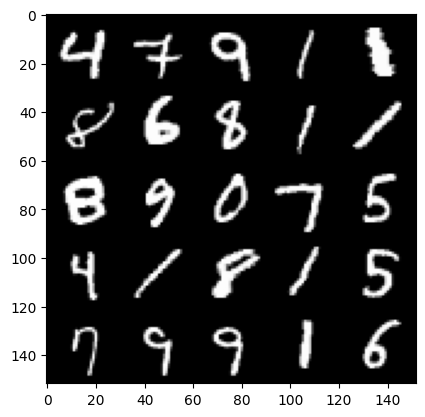

 66%|████████████████████████████████████████████████████▌                           | 308/469 [00:07<00:04, 38.70it/s]

Epoch 10, step 5000: Generator loss: 0.6240515457391735, discriminator loss: 0.6797365716695782


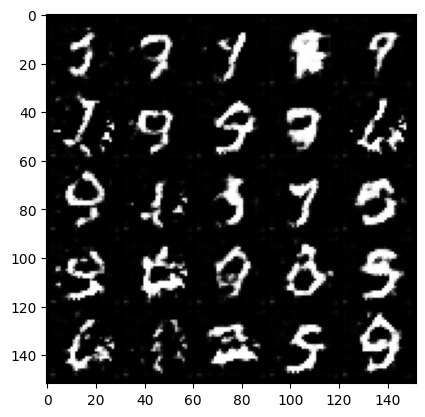

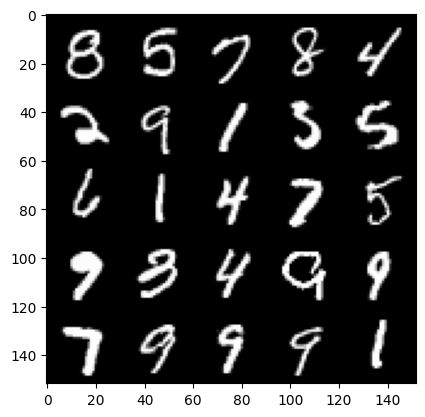

 73%|██████████████████████████████████████████████████████████▏                     | 341/469 [00:08<00:03, 39.91it/s]

Epoch 11, step 5500: Generator loss: 0.6428848556280133, discriminator loss: 0.6853305691480639


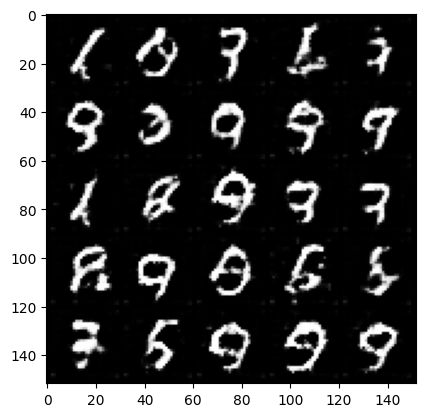

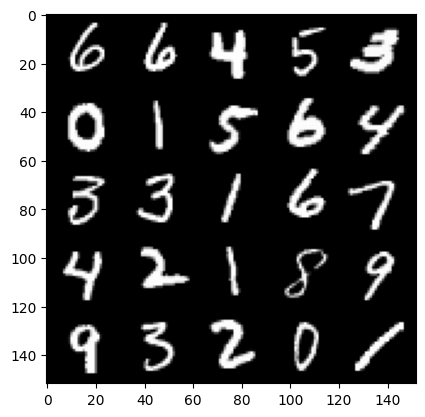

 79%|███████████████████████████████████████████████████████████████                 | 370/469 [00:09<00:02, 42.37it/s]

Epoch 12, step 6000: Generator loss: 0.6618227816820142, discriminator loss: 0.688690063595771


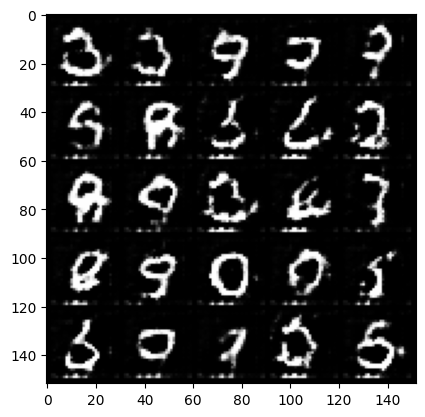

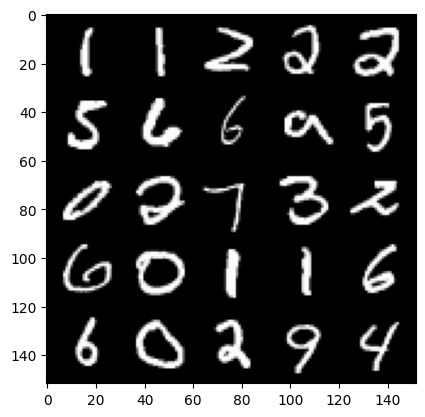

 85%|████████████████████████████████████████████████████████████████████▏           | 400/469 [00:09<00:01, 38.92it/s]

Epoch 13, step 6500: Generator loss: 0.6767473752498626, discriminator loss: 0.6914962242841719


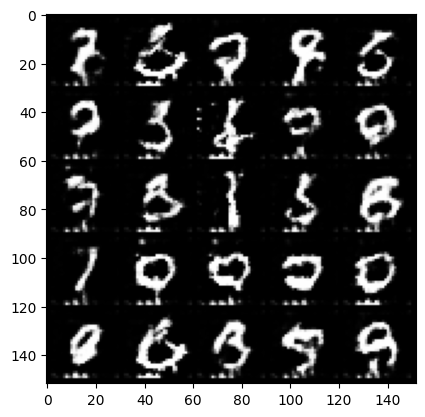

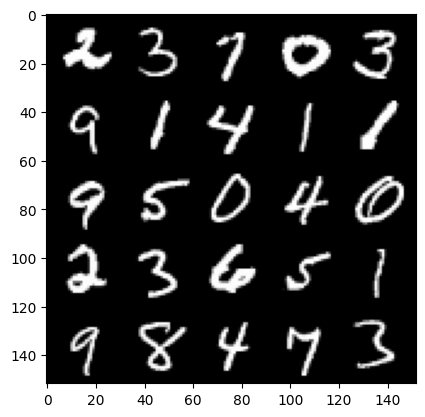

 92%|█████████████████████████████████████████████████████████████████████████▊      | 433/469 [00:10<00:00, 41.66it/s]

Epoch 14, step 7000: Generator loss: 0.6885176424980163, discriminator loss: 0.6927626204490661


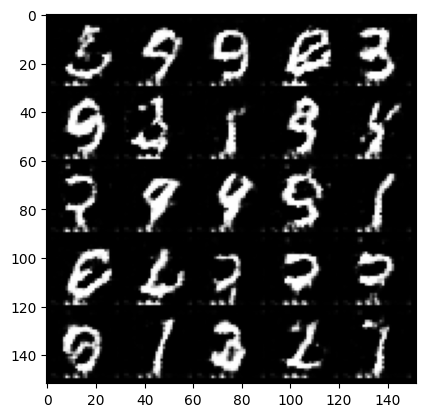

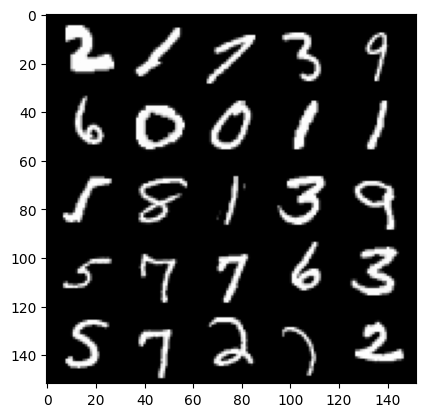

 99%|██████████████████████████████████████████████████████████████████████████████▉ | 463/469 [00:11<00:00, 37.48it/s]

Epoch 15, step 7500: Generator loss: 0.6927983368635169, discriminator loss: 0.6932592730522149


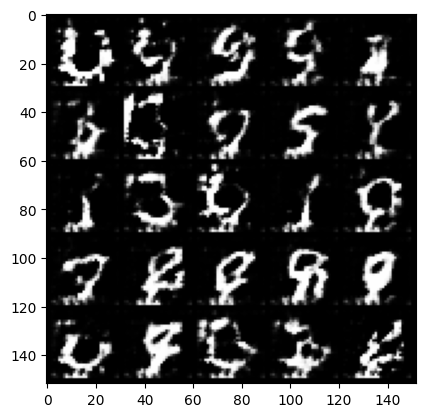

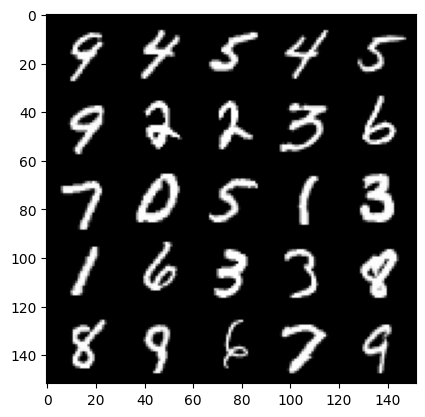

  5%|███▉                                                                             | 23/469 [00:00<00:11, 40.14it/s]

Epoch 17, step 8000: Generator loss: 0.6874850208759312, discriminator loss: 0.6924341269731519


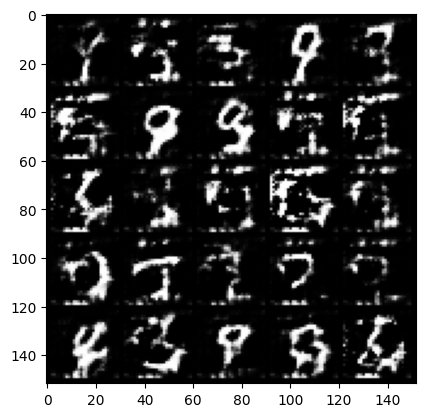

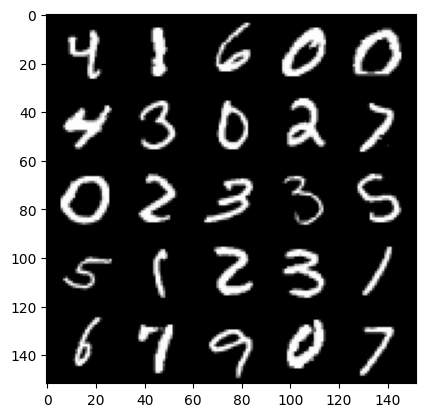

 12%|█████████▊                                                                       | 57/469 [00:01<00:09, 41.34it/s]

Epoch 18, step 8500: Generator loss: 0.6905040681362146, discriminator loss: 0.6928136788606648


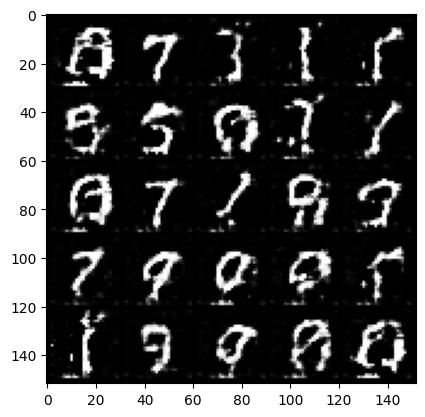

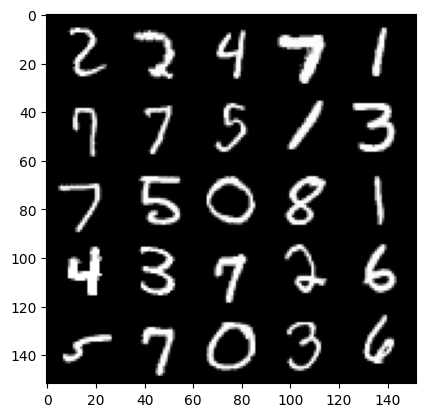

 19%|███████████████▎                                                                 | 89/469 [00:02<00:09, 41.77it/s]

Epoch 19, step 9000: Generator loss: 0.6930063862800602, discriminator loss: 0.6931960755586625


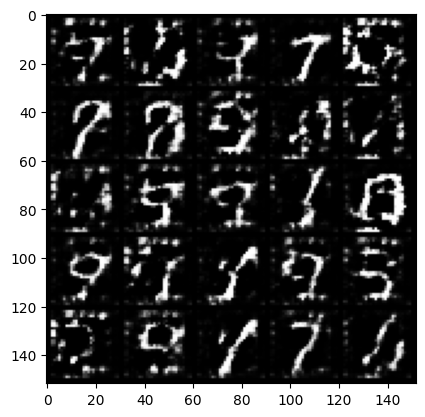

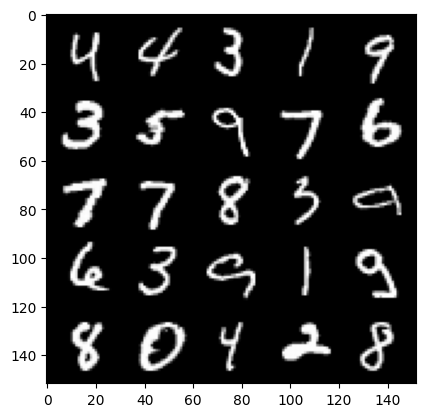

 25%|████████████████████▏                                                           | 118/469 [00:02<00:09, 37.01it/s]

Epoch 20, step 9500: Generator loss: 0.6908878167867665, discriminator loss: 0.6928152067661285


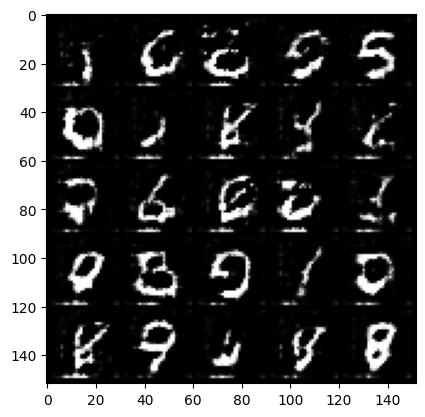

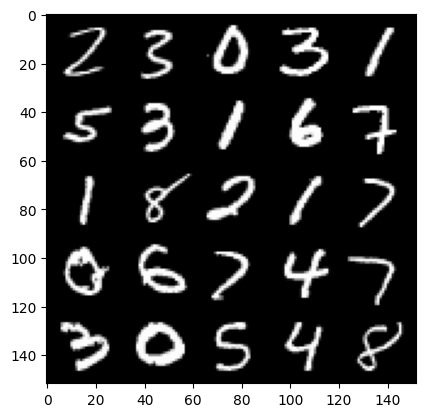

 32%|█████████████████████████▏                                                      | 148/469 [00:03<00:07, 41.58it/s]

Epoch 21, step 10000: Generator loss: 0.6929700716733933, discriminator loss: 0.6932153446674348


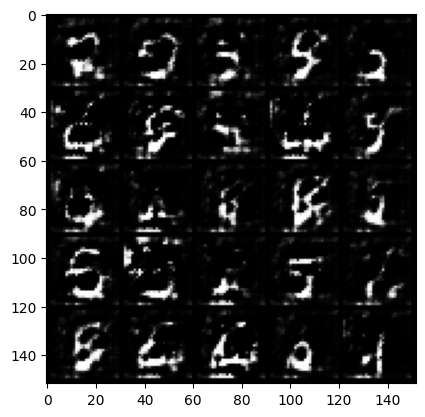

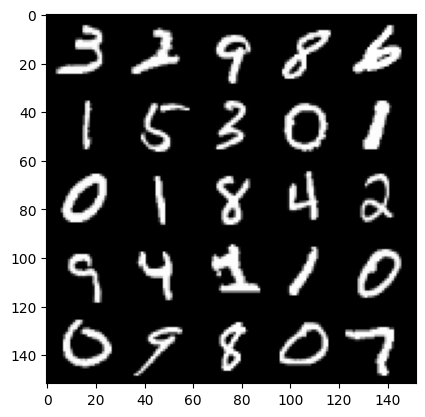

 39%|██████████████████████████████▊                                                 | 181/469 [00:04<00:07, 40.95it/s]

Epoch 22, step 10500: Generator loss: 0.6918504372835163, discriminator loss: 0.6931810919046402


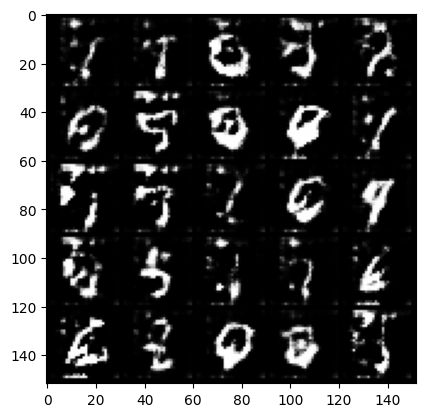

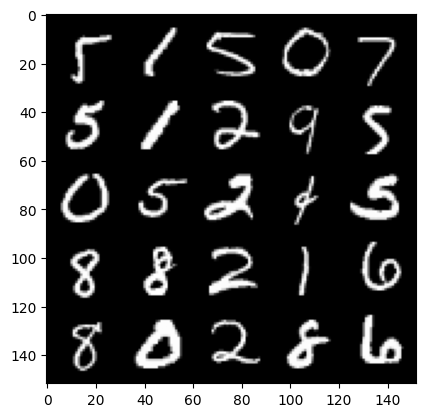

 45%|████████████████████████████████████▏                                           | 212/469 [00:05<00:06, 40.75it/s]

Epoch 23, step 11000: Generator loss: 0.6879608045816418, discriminator loss: 0.6927659330368036


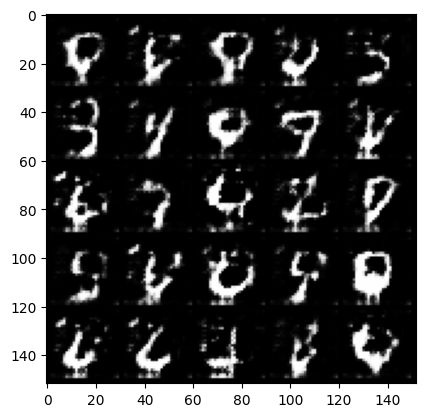

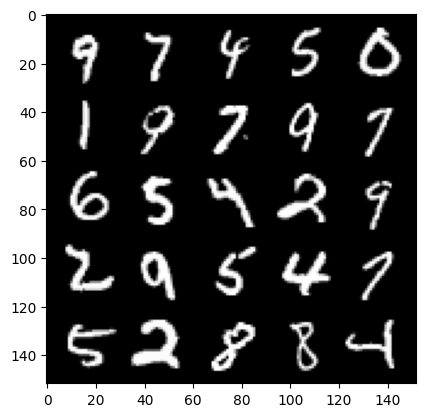

 51%|████████████████████████████████████████▉                                       | 240/469 [00:05<00:05, 42.08it/s]

Epoch 24, step 11500: Generator loss: 0.6914305090904236, discriminator loss: 0.6931419519186023


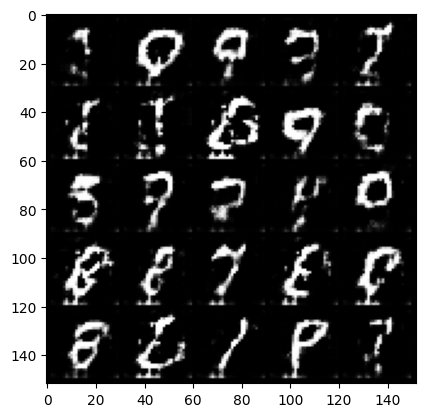

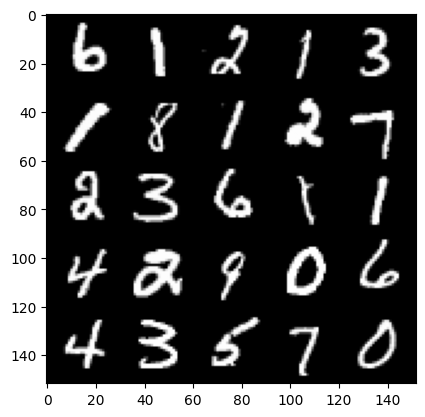

 58%|██████████████████████████████████████████████▍                                 | 272/469 [00:06<00:04, 40.27it/s]

Epoch 25, step 12000: Generator loss: 0.6930331368446359, discriminator loss: 0.6931822363138203


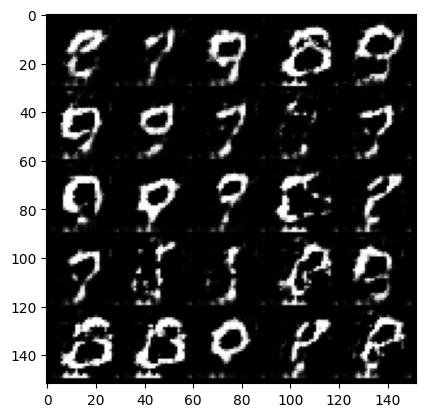

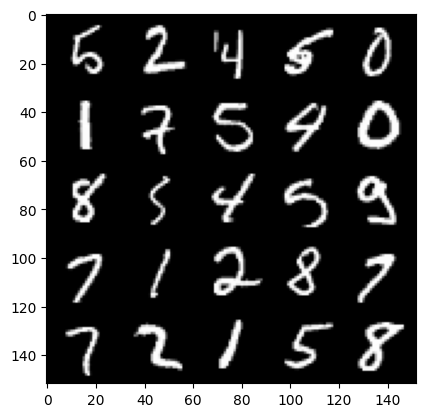

 65%|████████████████████████████████████████████████████                            | 305/469 [00:07<00:03, 41.99it/s]

Epoch 26, step 12500: Generator loss: 0.6930805436372759, discriminator loss: 0.693175115346908


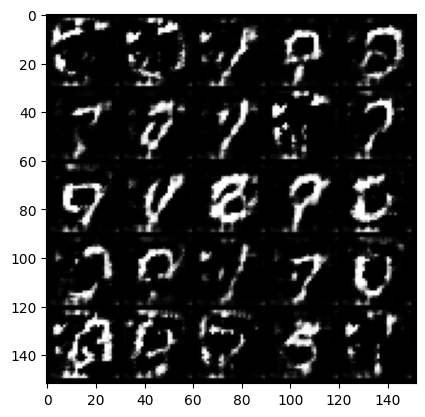

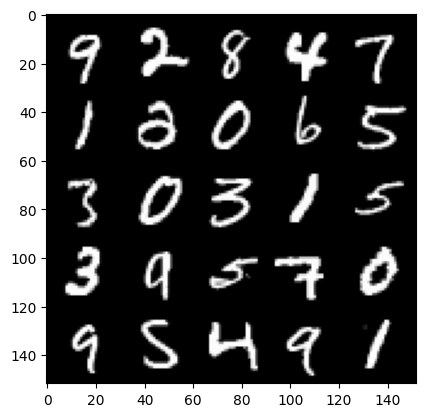

 72%|█████████████████████████████████████████████████████████▎                      | 336/469 [00:08<00:03, 39.10it/s]

Epoch 27, step 13000: Generator loss: 0.6894220436811455, discriminator loss: 0.6928324240446084


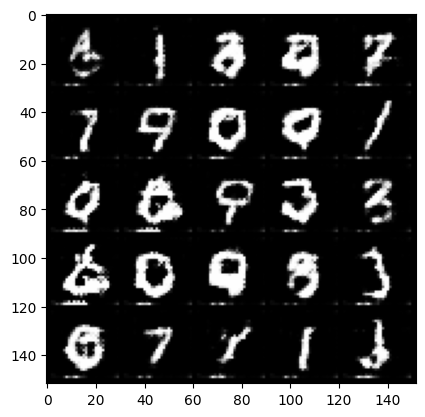

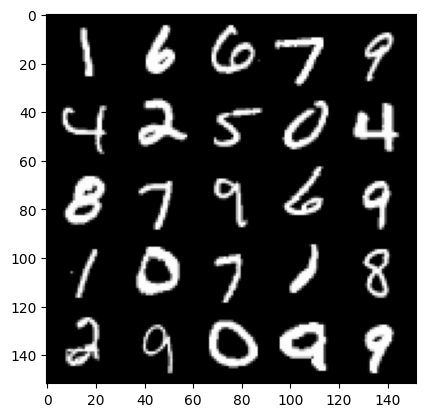

 78%|██████████████████████████████████████████████████████████████▊                 | 368/469 [00:09<00:02, 41.41it/s]

Epoch 28, step 13500: Generator loss: 0.6917894313335413, discriminator loss: 0.6931339715719235


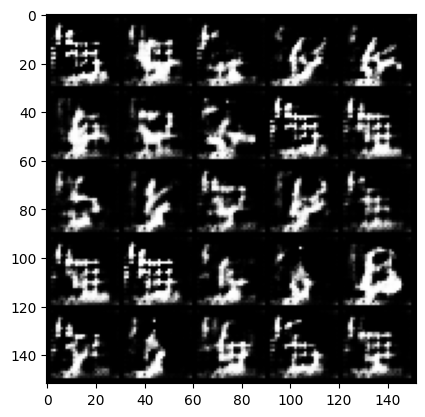

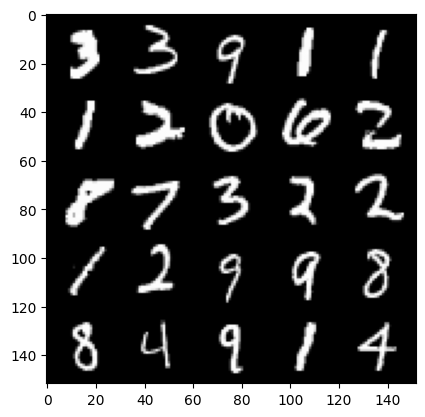

 84%|███████████████████████████████████████████████████████████████████▍            | 395/469 [00:09<00:01, 40.59it/s]

Epoch 29, step 14000: Generator loss: 0.693013739109039, discriminator loss: 0.6932001551389692


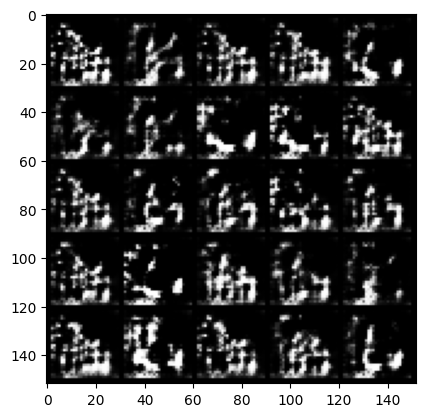

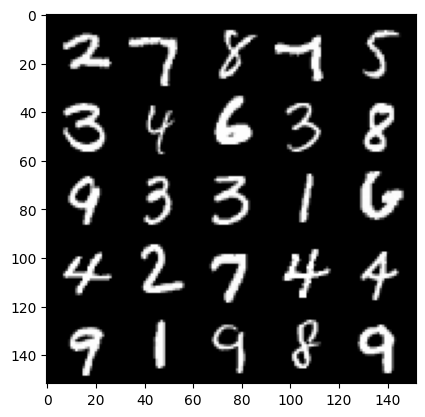

 91%|████████████████████████████████████████████████████████████████████████▋       | 426/469 [00:10<00:01, 40.83it/s]

Epoch 30, step 14500: Generator loss: 0.6929709571599958, discriminator loss: 0.6932090001106274


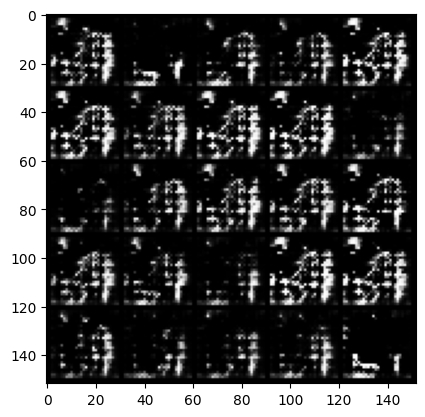

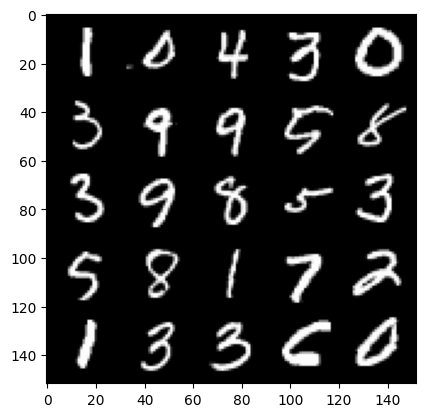

 98%|██████████████████████████████████████████████████████████████████████████████▋ | 461/469 [00:11<00:00, 40.51it/s]

Epoch 31, step 15000: Generator loss: 0.6930850479602818, discriminator loss: 0.6931741772890084


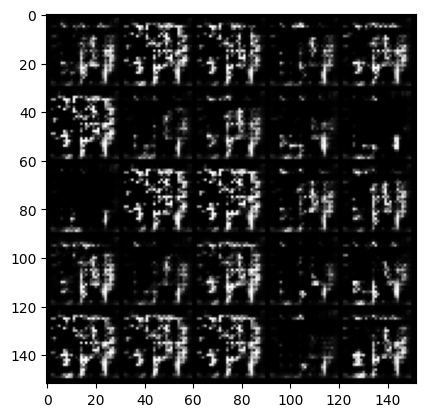

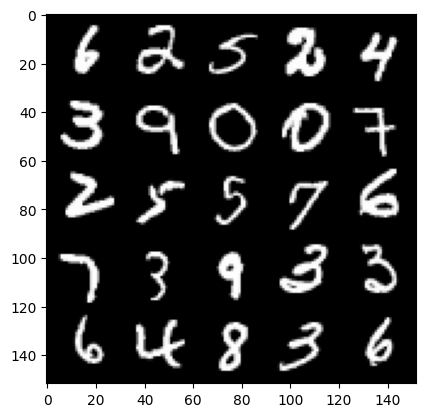

  5%|███▉                                                                             | 23/469 [00:00<00:11, 40.27it/s]

Epoch 33, step 15500: Generator loss: 0.6931007288694383, discriminator loss: 0.6931688050031665


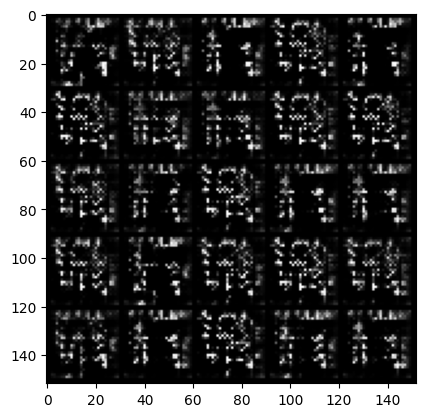

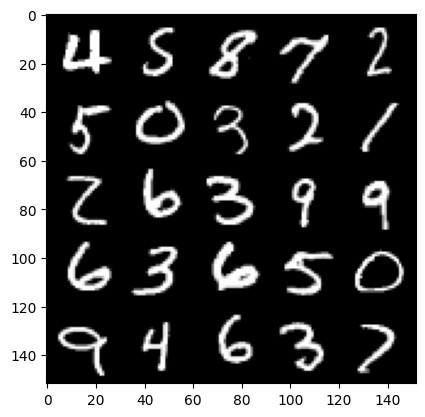

 11%|█████████▏                                                                       | 53/469 [00:01<00:10, 40.35it/s]

Epoch 34, step 16000: Generator loss: 0.6931269907951352, discriminator loss: 0.69315244269371


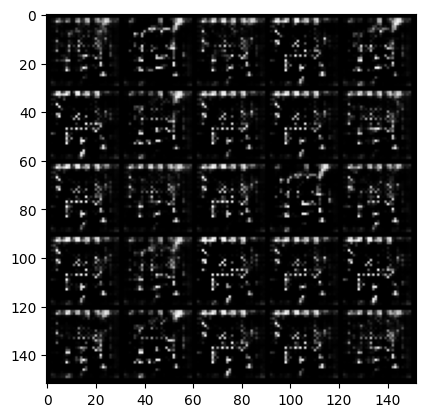

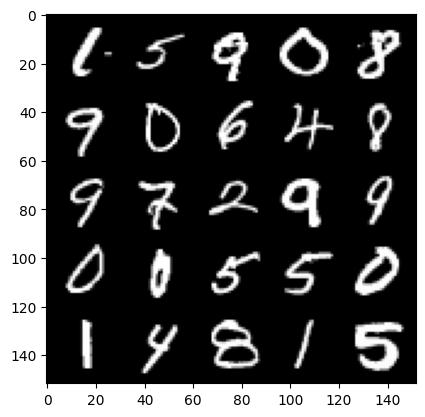

 17%|██████████████▏                                                                  | 82/469 [00:02<00:09, 40.31it/s]

Epoch 35, step 16500: Generator loss: 0.6931217331886294, discriminator loss: 0.6931570248603824


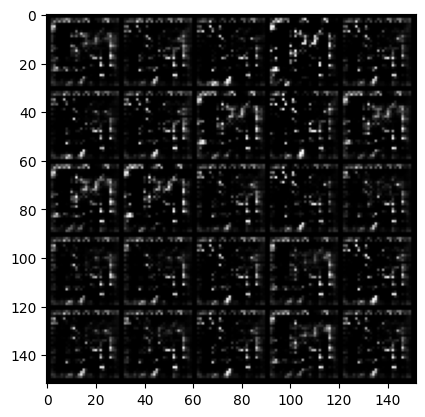

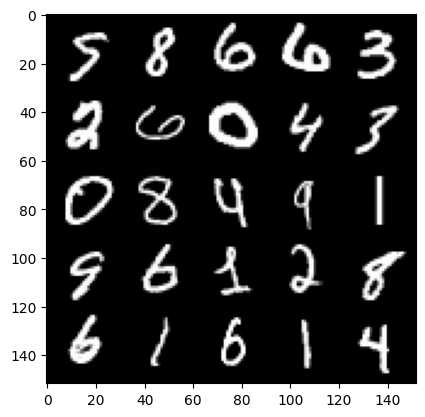

 24%|███████████████████▎                                                            | 113/469 [00:02<00:08, 40.39it/s]

Epoch 36, step 17000: Generator loss: 0.6931369118690489, discriminator loss: 0.6931483379602433


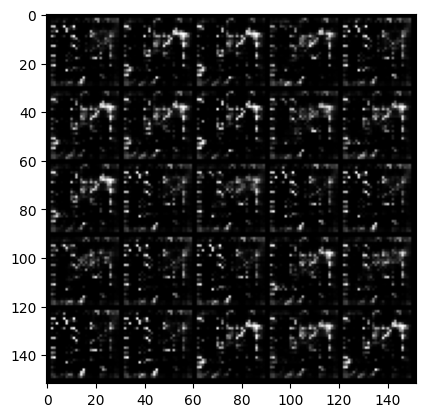

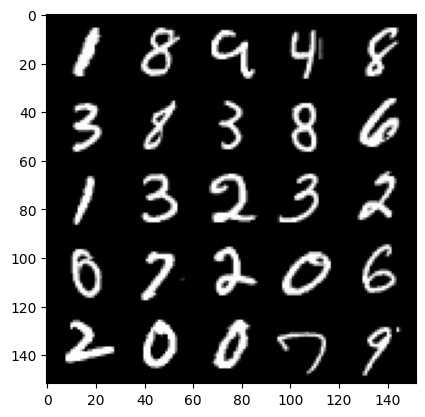

 31%|████████████████████████▋                                                       | 145/469 [00:03<00:08, 39.78it/s]

Epoch 37, step 17500: Generator loss: 0.6931186810731886, discriminator loss: 0.6931505347490307


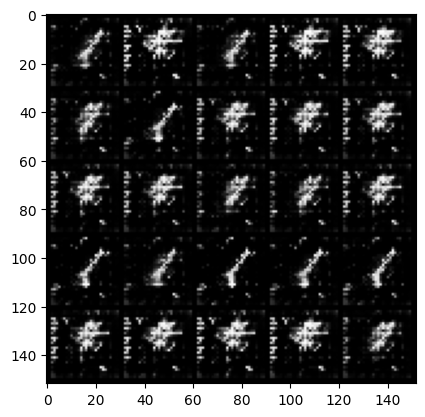

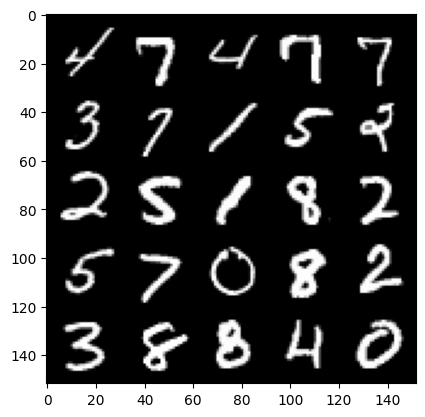

 38%|██████████████████████████████▏                                                 | 177/469 [00:04<00:07, 41.24it/s]

Epoch 38, step 18000: Generator loss: 0.6931452866792667, discriminator loss: 0.6931478031873751


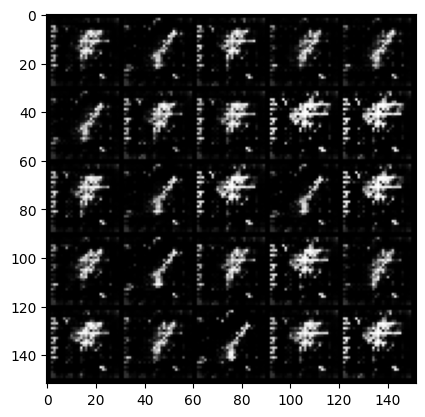

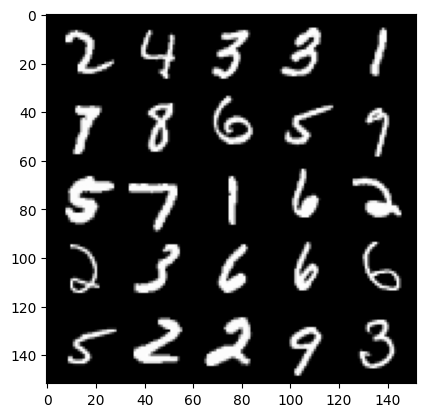

 44%|███████████████████████████████████▍                                            | 208/469 [00:05<00:06, 38.76it/s]

Epoch 39, step 18500: Generator loss: 0.6931463794708292, discriminator loss: 0.6931474436521453


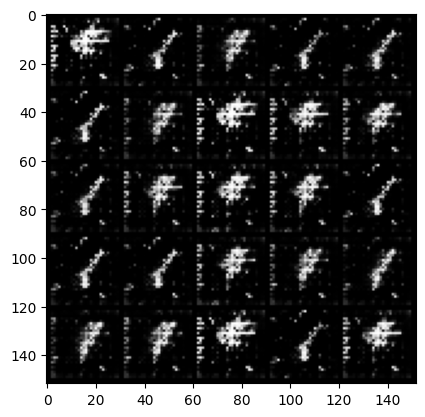

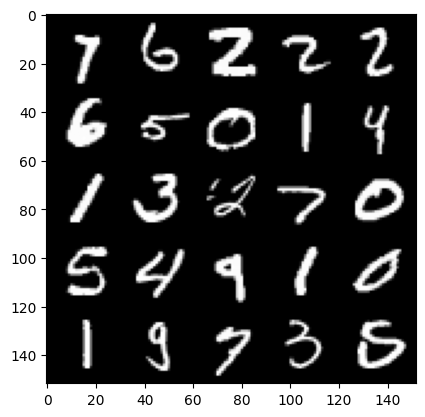

 50%|████████████████████████████████████████▎                                       | 236/469 [00:05<00:05, 40.13it/s]

Epoch 40, step 19000: Generator loss: 0.6931467620134355, discriminator loss: 0.6931473119258938


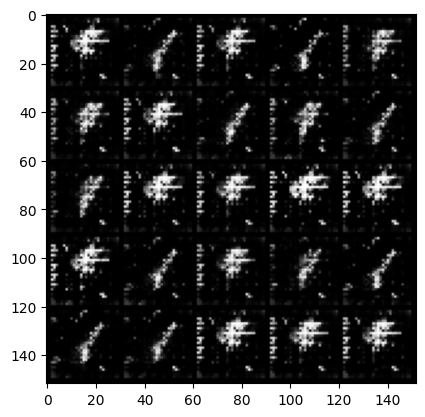

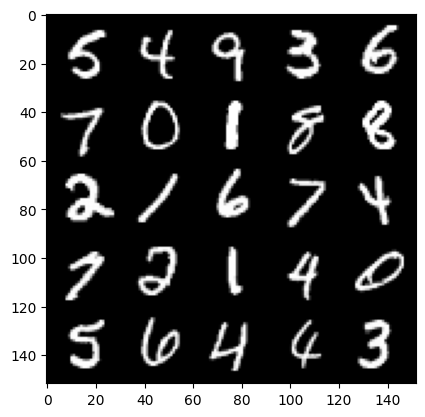

 58%|██████████████████████████████████████████████▏                                 | 271/469 [00:06<00:04, 39.71it/s]

Epoch 41, step 19500: Generator loss: 0.6931469166278872, discriminator loss: 0.6931472561359397


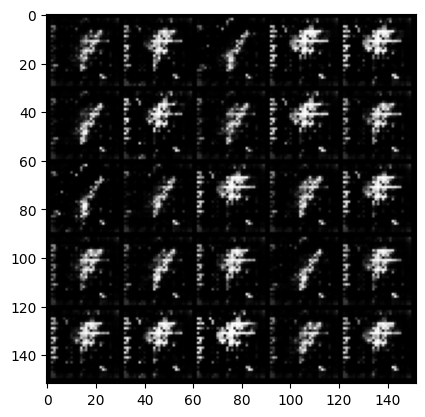

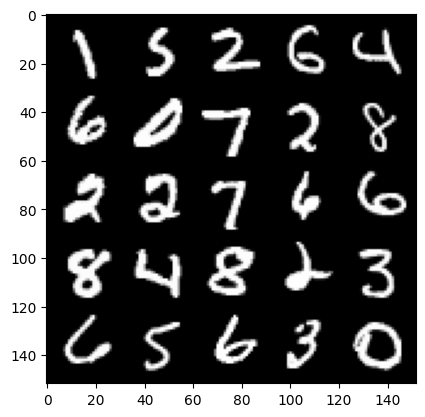

 64%|██████████████████████████████████████████████████▊                             | 298/469 [00:07<00:04, 40.70it/s]

Epoch 42, step 20000: Generator loss: 0.6931469911336844, discriminator loss: 0.6931472135782244


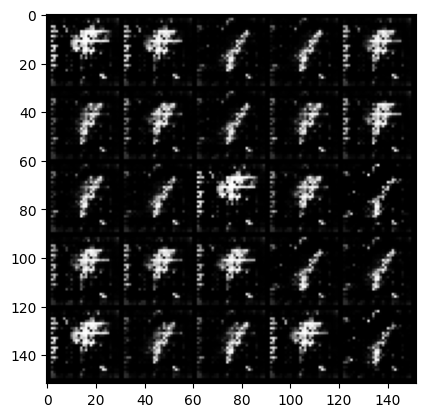

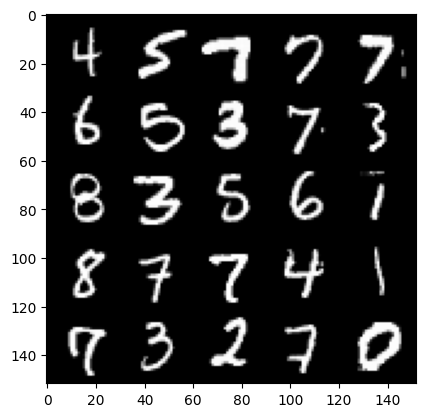

 71%|████████████████████████████████████████████████████████▍                       | 331/469 [00:08<00:03, 41.28it/s]

Epoch 43, step 20500: Generator loss: 0.6931470623016357, discriminator loss: 0.693147188186649


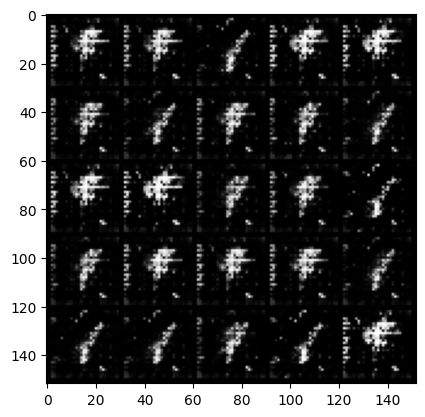

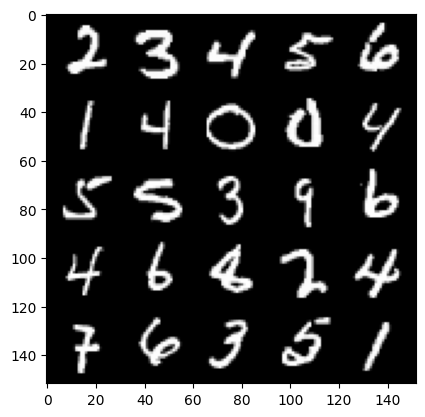

 77%|█████████████████████████████████████████████████████████████▋                  | 362/469 [00:08<00:02, 41.98it/s]

Epoch 44, step 21000: Generator loss: 0.6931470632553101, discriminator loss: 0.6931472084522265


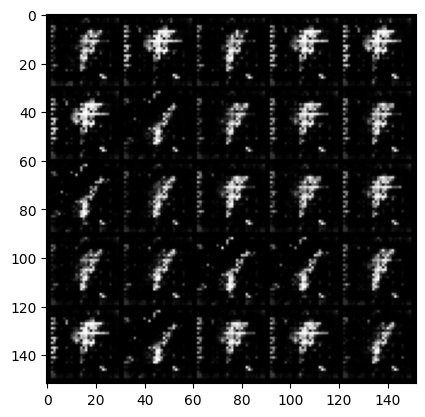

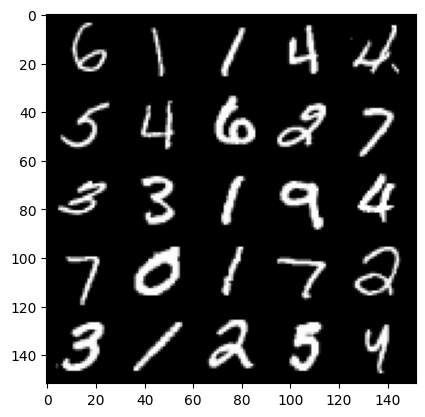

 84%|██████████████████████████████████████████████████████████████████▊             | 392/469 [00:09<00:01, 40.06it/s]

Epoch 45, step 21500: Generator loss: 0.6931470632553101, discriminator loss: 0.6931472231149683


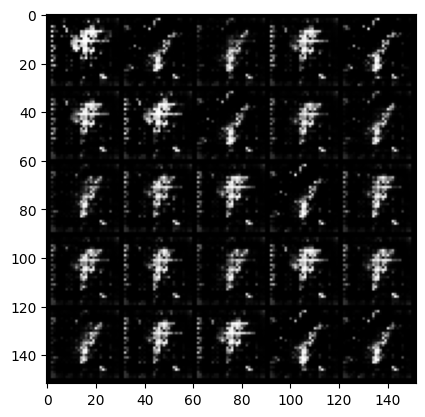

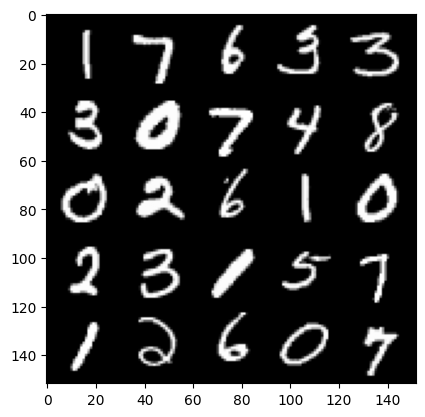

 91%|████████████████████████████████████████████████████████████████████████▋       | 426/469 [00:10<00:01, 37.43it/s]

Epoch 46, step 22000: Generator loss: 0.6931465282440197, discriminator loss: 0.6931475323438622


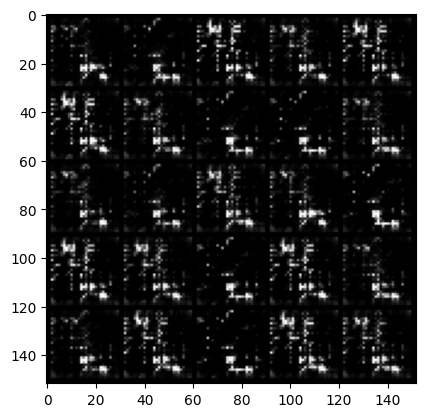

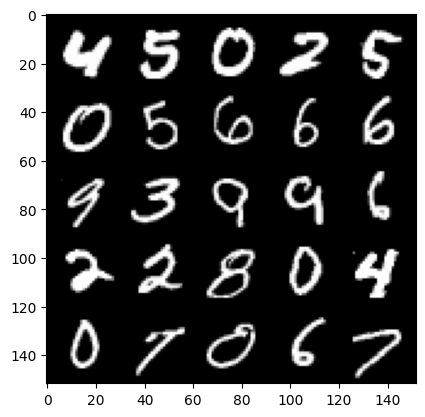

 97%|█████████████████████████████████████████████████████████████████████████████▍  | 454/469 [00:11<00:00, 40.28it/s]

Epoch 47, step 22500: Generator loss: 0.5330751035809519, discriminator loss: 0.7438417180776601


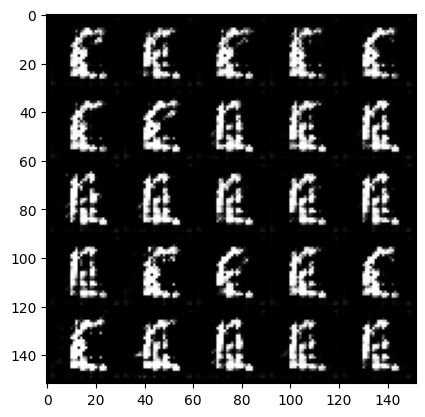

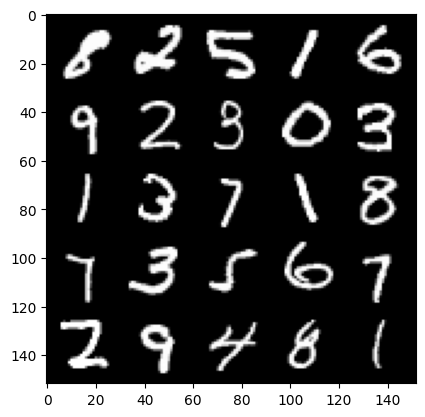

  3%|██▊                                                                              | 16/469 [00:00<00:12, 37.54it/s]

Epoch 49, step 23000: Generator loss: 0.31326414531469315, discriminator loss: 0.8133736256361012


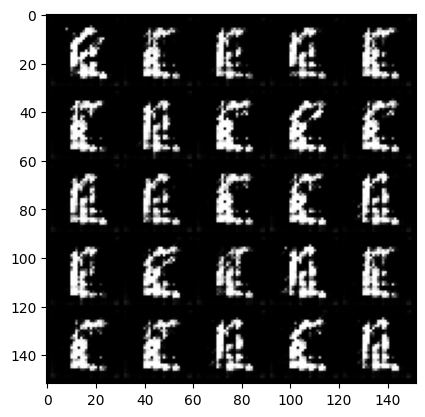

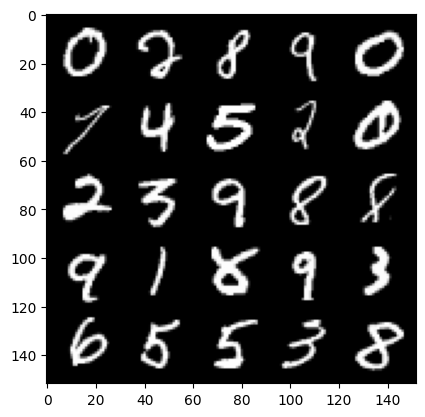

100%|████████████████████████████████████████████████████████████████████████████████| 469/469 [00:11<00:00, 39.35it/s]


In [11]:
n_epochs = 50
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        ## Update discriminator ##
        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step
        # Update gradients
        disc_loss.backward(retain_graph=True)
        # Update optimizer
        disc_opt.step()

        ## Update generator ##
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ## Visualization code ##
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Epoch {epoch}, step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1